# IRIS SECTION 

In [9]:
import numpy as np
import importlib
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
import svm   
importlib.reload(svm)

iris = load_iris()
binary_mask = (iris.target == 0) | (iris.target == 1)

X = iris.data[binary_mask, :2]
y = iris.target[binary_mask] 

X, y = svm._check_X_y(X, y)


In [12]:
#for different experiments we will update the config 
config = svm.LinearSVMConfig(
    C=50,          # 6 gives a wide margin, 13 gives a slightly smaller margin
    learning_rate=0.001, # Significantly increase learning rate
    n_epochs=5000,   # 500 is the sweet spot for 6
                  
    batch_size=32, ## Batch size changes the boundary line quite a lot
    verbose=True
)

clf = svm.LinearSVM(config=config)

print("\nStarting Training...")
clf.fit(X,y) 

print("\nTraining Complete.")
print(f"Final Weights (w): {clf.w}")
print(f"Final Bias (b): {clf.b:.4f}")


Starting Training...
[-0.22838937  0.23351721 -0.21485885  0.29568287  0.2828849   0.31616538
 -0.24557541  0.25838059  0.29056224 -0.2415536   0.30190232  0.26313494
  0.23644019 -0.19657399 -0.22838937 -0.21997948 -0.2086394  -0.21888066
 -0.24923094 -0.20169461 -0.22802309  0.30592412 -0.21047077  0.2828849
  0.2759329   0.29678169 -0.20937195 -0.22034575  0.26350121  0.27776428
  0.2803282   0.26898812]
[-0.1625291  -0.16875559 -0.19228212  0.22065573  0.23883358 -0.16837939
 -0.17385347 -0.19165512  0.23808118  0.19102812 -0.18668264  0.20210168
  0.14957453  0.22625521  0.27393528  0.22053033  0.22040493  0.19040111
  0.24430767 -0.17435507 -0.15082854  0.22053033  0.1968784   0.21480545
 -0.18033075 -0.20536209  0.21430385  0.20285408  0.20882977 -0.19938641
  0.2326071   0.21505625]
[ 0.20631167  0.12343888  0.15540407  0.13479867 -0.03969208  0.18063228
 -0.07839423  0.15624973 -0.05189752 -0.06537147 -0.07588559  0.13226167
 -0.059903    0.1558269  -0.09186818  0.16507252  0


Plotting Decision Boundary...


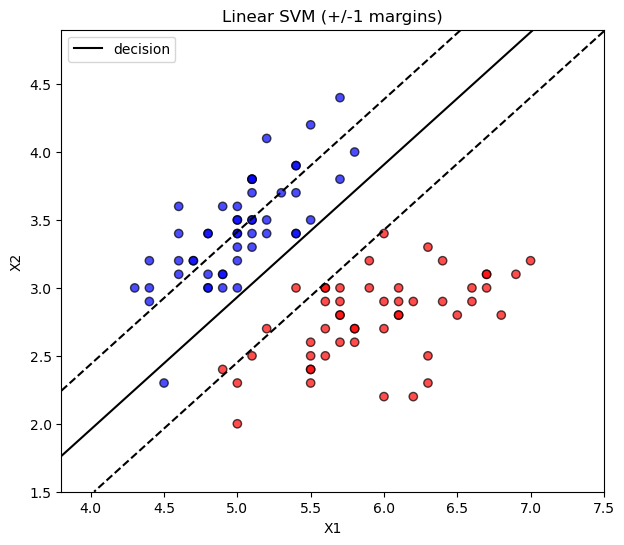

In [13]:
# Plot the results (requires matplotlib to be installed)
# We pass X and the original y_raw {0, 1} to the plot function for clear coloring
print("\nPlotting Decision Boundary...")
svm.plot_linear_svm_2d(clf, X, y)

# BLOB GRAPHS

In [4]:
### MAKE_BLOBS creates gaussian distribution with set hyperparameters for the standard deviation
from sklearn.datasets import make_blobs

X_blobs, y_blobs = make_blobs(
    n_samples=500,        
    n_features=2,         # Dimenstions
    centers=2,            # Number of centers/clusters to generate
                          # 0,1
    cluster_std=2.5,      
                          # We can maybe expirement with this. Maybe a range from (0.5  to 4) for
                          # seeing how well it does with varying seperability.  
    random_state=42       
)

print("Shape of X_blobs:", X_blobs.shape)
print("Shape of y_blobs:", y_blobs.shape)

X,y = svm._check_X_y(X_blobs,y_blobs)

Shape of X_blobs: (500, 2)
Shape of y_blobs: (500,)



Starting Training...
[ 6.70790739  2.53628946  6.44070471  3.33407831 -1.46176016 -1.53635431
  5.38434825 -0.82068082  0.33996891  7.26527513  6.46235323  0.60959873
 -1.28143389  6.88397726 -0.08911647  5.7486417  -0.70682691  6.56066884
  7.6951614   7.57910636 -1.55207714  1.16573478  4.21043234  7.6207835
  8.03562379  8.32985862  5.86446833  3.84655323  6.69708648  4.03080799
  0.35224845  5.14306198]
[ 1.77188908  1.59579209  2.52592362  2.93416737  4.14695502  7.59234733
  4.71002344  6.25834942  3.64050847  1.57488826  4.49994128  3.72219476
  0.94703596  4.70016517  3.48569158  6.66246693  6.89752677  1.63215594
  4.57639643  1.41877345  0.37746184  5.40248132 -0.42265072  0.40740681
  6.22746554  1.56362059  3.50213546  3.23532354  5.07687783  6.23258308
  4.79740806  4.9117651 ]
[ 3.26210453  5.7747148   2.23060601  1.42285896  1.32538049  3.96007265
  4.16775143  2.87348301  6.09409892  4.73717202  4.35150031 -0.79595867
  2.37376423  3.1936412   0.03669476  2.92160121 -0

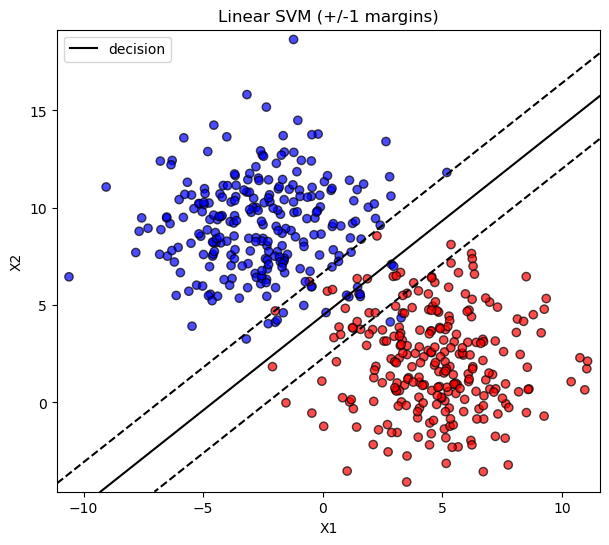

In [5]:
#for different experiments we will update the config 
config = svm.LinearSVMConfig(
    C=13.0,           
    learning_rate=0.01, 
    n_epochs=500,   # Increase the number of steps
    batch_size=32,
    verbose=True,
    random_state=10
)

clf = svm.LinearSVM(config=config)

print("\nStarting Training...")
clf.fit(X,y) 

print("\nTraining Complete.")
print(f"Final Weights (w): {clf.w}")
print(f"Final Bias (b): {clf.b:.4f}")
# Plot the results (requires matplotlib to be installed)
# We pass X and the original y_raw {0, 1} to the plot function for clear coloring
print("\nPlotting Decision Boundary...")
svm.plot_linear_svm_2d(clf, X, y)